In [57]:
import numpy as np
import matplotlib.pyplot as plt

In [58]:
np.random.seed(42)
N = 500  # Points per class
# Generating 3 clusters in 2D space
c1 = np.random.randn(N, 2) + np.array([0, 0])
c2 = np.random.randn(N, 2) + np.array([5, 5])
c3 = np.random.randn(N, 2) + np.array([0, 10])

In [59]:
X = np.vstack([c1, c2, c3])
# One-hot encoding for 3 classes
y = np.zeros((3 * N, 3))
y[:N, 0] = 1
y[N:2*N, 1] = 1
y[2*N:, 2] = 1

In [60]:
indices = np.random.permutation(len(X))
train_idx, val_idx, test_idx = indices[:900], indices[900:1200], indices[1200:]

X_train, y_train = X[train_idx], y[train_idx]
X_val, y_val = X[val_idx], y[val_idx]
X_test, y_test = X[test_idx], y[test_idx]

In [61]:
input_nodes = 2
hidden_nodes = 8  # You can change this for different architectures
output_nodes = 3
lr = 0.01
epochs = 100

In [62]:
# Initialize weights and biases randomly
W1 = np.random.randn(input_nodes, hidden_nodes) * 0.1
b1 = np.zeros((1, hidden_nodes))
W2 = np.random.randn(hidden_nodes, output_nodes) * 0.1
b2 = np.zeros((1, output_nodes))

In [63]:
def sigmoid(x): return 1 / (1 + np.exp(-x))
def sigmoid_der(x): return x * (1 - x)

In [64]:
#  TRAINING LOOP (SGD)
train_errors = []

for epoch in range(epochs):
    epoch_loss = 0
    # Shuffle training data for SGD each epoch
    shuffled_idx = np.random.permutation(len(X_train))

    for i in shuffled_idx:
        xi = X_train[i:i+1] # shape (1, 2)
        yi = y_train[i:i+1] # shape (1, 3)

        # --- Forward Pass ---
        z1 = np.dot(xi, W1) + b1
        a1 = sigmoid(z1)
        z2 = np.dot(a1, W2) + b2
        a2 = sigmoid(z2)

        # --- Compute Loss (Squared Error) ---
        loss = 0.5 * np.sum((yi - a2)**2)
        epoch_loss += loss

        # --- Backpropagation ---
        # Error at output layer
        error_out = (a2 - yi) * sigmoid_der(a2)

        # Error at hidden layer
        error_hidden = np.dot(error_out, W2.T) * sigmoid_der(a1)

        # --- Gradient Updates (SGD) ---
        W2 -= lr * np.dot(a1.T, error_out)
        b2 -= lr * error_out
        W1 -= lr * np.dot(xi.T, error_hidden)
        b1 -= lr * error_hidden

    train_errors.append(epoch_loss / len(X_train))

In [65]:
def predict(X_data):
    a1 = sigmoid(np.dot(X_data, W1) + b1)
    a2 = sigmoid(np.dot(a1, W2) + b2)
    return np.argmax(a2, axis=1)

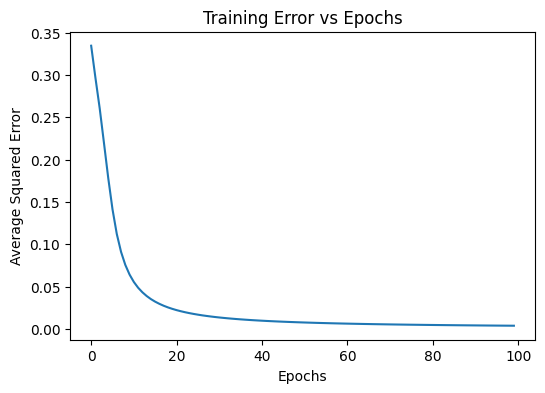

In [66]:
plt.figure(figsize=(6,4))
plt.plot(train_errors)
plt.title("Training Error vs Epochs")
plt.xlabel("Epochs")
plt.ylabel("Average Squared Error")
plt.show()

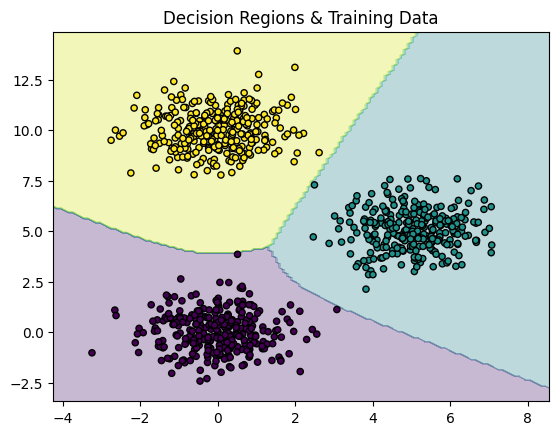

In [67]:
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1), np.arange(y_min, y_max, 0.1))
grid_points = np.c_[xx.ravel(), yy.ravel()]
Z = predict(grid_points)
Z = Z.reshape(xx.shape)

plt.contourf(xx, yy, Z, alpha=0.3)
plt.scatter(X_train[:, 0], X_train[:, 1], c=np.argmax(y_train, axis=1), edgecolors='k', s=20)
plt.title("Decision Regions & Training Data")
plt.show()

In [68]:
# Classification Accuracy
val_preds = predict(X_val)
val_actual = np.argmax(y_val, axis=1)
accuracy = np.mean(val_preds == val_actual)
print(f"Validation Accuracy: {accuracy * 100:.2f}%")

Validation Accuracy: 100.00%


In [69]:
def evaluate(X_data, Y_data, label):
    preds = predict(X_data)
    actual = np.argmax(Y_data, axis=1)
    matrix = np.zeros((3, 3), dtype=int)
    for a, p in zip(actual, preds):
        matrix[a][p] += 1
    accuracy = np.mean(preds == actual)
    print(f"\n--- Req 3: {label} Results ---")
    print(f"Accuracy: {accuracy*100:.2f}%")
    print("Confusion Matrix:\n", matrix)

evaluate(X_val, y_val, "Validation")
evaluate(X_test, y_test, "Test")


--- Req 3: Validation Results ---
Accuracy: 100.00%
Confusion Matrix:
 [[ 98   0   0]
 [  0 103   0]
 [  0   0  99]]

--- Req 3: Test Results ---
Accuracy: 100.00%
Confusion Matrix:
 [[ 96   0   0]
 [  0 111   0]
 [  0   0  93]]


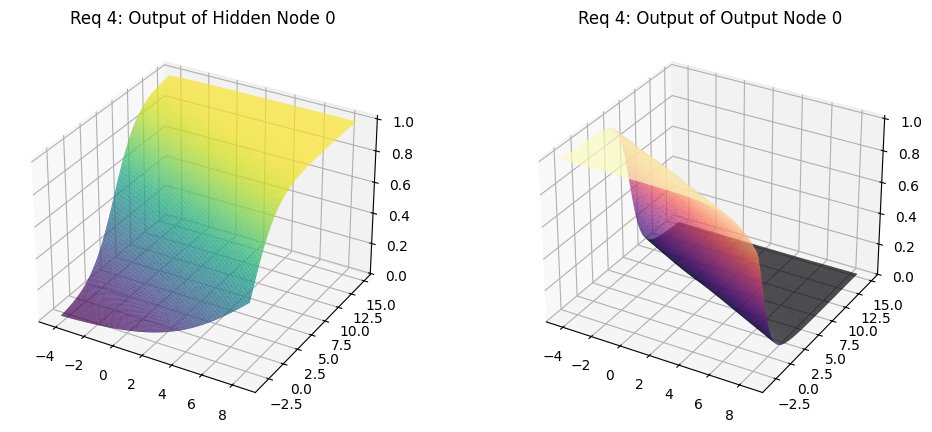

In [70]:
# Plotting 1st hidden node and 1st output node as examples
fig = plt.figure(figsize=(12, 5))

# Hidden Node 0 Output
ax1 = fig.add_subplot(121, projection='3d')
h_all = sigmoid(np.dot(grid_points, W1) + b1)
ax1.plot_trisurf(grid_points[:,0], grid_points[:,1], h_all[:, 0], cmap='viridis')
ax1.set_title("Req 4: Output of Hidden Node 0")

# Output Node 0 Output
ax2 = fig.add_subplot(122, projection='3d')
out_all = sigmoid(np.dot(h_all, W2) + b2)
ax2.plot_trisurf(grid_points[:,0], grid_points[:,1], out_all[:, 0], cmap='magma')
ax2.set_title("Req 4: Output of Output Node 0")
plt.show()

In [71]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score


In [72]:
X, y = make_moons(n_samples=1000, noise=0.2, random_state=42)
y = y.reshape(-1, 1)   # column vector

# Train / Validation / Test split
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)


In [73]:
def sigmoid(z):
    return 1 / (1 + np.exp(-z))

def sigmoid_deriv(z):
    s = sigmoid(z)
    return s * (1 - s)


In [74]:
class FCNN:
    def __init__(self, h1, h2, lr=0.01):
        self.lr = lr
        self.W1 = np.random.randn(2, h1)
        self.b1 = np.zeros((1, h1))
        self.W2 = np.random.randn(h1, h2)
        self.b2 = np.zeros((1, h2))
        self.W3 = np.random.randn(h2, 1)
        self.b3 = np.zeros((1, 1))

    def forward(self, X):
        self.z1 = X @ self.W1 + self.b1
        self.a1 = sigmoid(self.z1)

        self.z2 = self.a1 @ self.W2 + self.b2
        self.a2 = sigmoid(self.z2)

        self.z3 = self.a2 @ self.W3 + self.b3
        self.out = sigmoid(self.z3)
        return self.out

    def backward(self, X, y):
        error = self.out - y   # squared error derivative

        dW3 = self.a2.T @ (error * sigmoid_deriv(self.z3))
        db3 = np.sum(error * sigmoid_deriv(self.z3), axis=0, keepdims=True)

        d2 = (error * sigmoid_deriv(self.z3)) @ self.W3.T * sigmoid_deriv(self.z2)
        dW2 = self.a1.T @ d2
        db2 = np.sum(d2, axis=0, keepdims=True)

        d1 = d2 @ self.W2.T * sigmoid_deriv(self.z1)
        dW1 = X.T @ d1
        db1 = np.sum(d1, axis=0, keepdims=True)

        # SGD update
        self.W3 -= self.lr * dW3
        self.b3 -= self.lr * db3
        self.W2 -= self.lr * dW2
        self.b2 -= self.lr * db2
        self.W1 -= self.lr * dW1
        self.b1 -= self.lr * db1


In [85]:
architectures = [(4,4), (6,6), (8,8), (16,16),(32,32),(64,64)]
epochs = 200
results = {}

for h1, h2 in architectures:
    model = FCNN(h1, h2)
    val_errors = []

    for ep in range(epochs):
        for i in range(len(X_train)):
            model.forward(X_train[i:i+1])
            model.backward(X_train[i:i+1], y_train[i:i+1])

        val_pred = model.forward(X_val)
        val_error = np.mean((val_pred - y_val)**2)
        val_errors.append(val_error)

    results[(h1,h2)] = val_errors


In [86]:
best_arch = min(results, key=lambda k: results[k][-1])
print("Best architecture:", best_arch)

Best architecture: (64, 64)


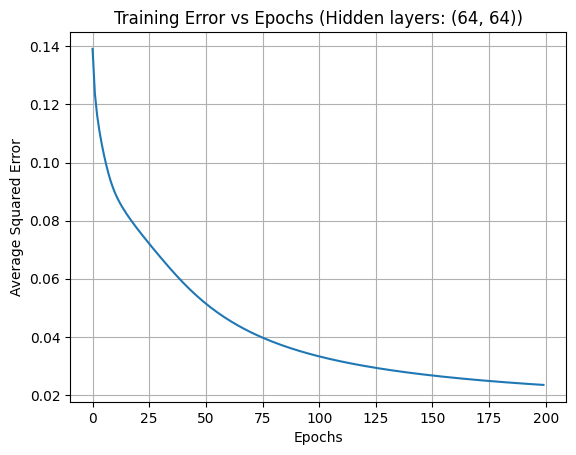

In [87]:
plt.plot(results[best_arch])
plt.xlabel("Epochs")
plt.ylabel("Average Squared Error")
plt.title(f"Training Error vs Epochs (Hidden layers: {best_arch})")
plt.grid()
plt.show()


In [88]:
model = FCNN(*best_arch)
for ep in range(epochs):
    for i in range(len(X_train)):
        model.forward(X_train[i:i+1])
        model.backward(X_train[i:i+1], y_train[i:i+1])


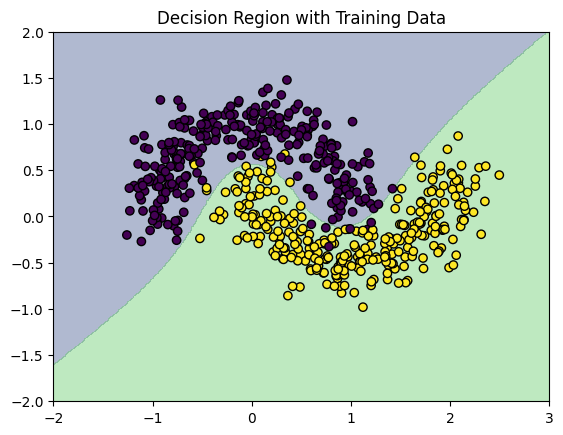

In [89]:
xx, yy = np.meshgrid(np.linspace(-2,3,300), np.linspace(-2,2,300))
grid = np.c_[xx.ravel(), yy.ravel()]
Z = model.forward(grid)
Z = Z.reshape(xx.shape)

plt.contourf(xx, yy, Z > 0.5, alpha=0.4)
plt.scatter(X_train[:,0], X_train[:,1], c=y_train[:,0], edgecolors='k')
plt.title("Decision Region with Training Data")
plt.show()


In [90]:
def evaluate(model, X, y):
    preds = (model.forward(X) > 0.5).astype(int)
    return confusion_matrix(y, preds), accuracy_score(y, preds)


In [91]:
for arch in architectures:
    model = FCNN(*arch)
    for ep in range(epochs):
        for i in range(len(X_train)):
            model.forward(X_train[i:i+1])
            model.backward(X_train[i:i+1], y_train[i:i+1])

    cm, acc = evaluate(model, X_val, y_val)
    print(f"Architecture {arch}")
    print("Confusion Matrix:\n", cm)
    print("Accuracy:", acc, "\n")


Architecture (4, 4)
Confusion Matrix:
 [[91 15]
 [10 84]]
Accuracy: 0.875 

Architecture (6, 6)
Confusion Matrix:
 [[93 13]
 [14 80]]
Accuracy: 0.865 

Architecture (8, 8)
Confusion Matrix:
 [[93 13]
 [13 81]]
Accuracy: 0.87 

Architecture (16, 16)
Confusion Matrix:
 [[94 12]
 [ 8 86]]
Accuracy: 0.9 

Architecture (32, 32)
Confusion Matrix:
 [[101   5]
 [  4  90]]
Accuracy: 0.955 

Architecture (64, 64)
Confusion Matrix:
 [[103   3]
 [  2  92]]
Accuracy: 0.975 



In [92]:
cm_test, acc_test = evaluate(model, X_test, y_test)
print("Test Confusion Matrix:\n", cm_test)
print("Test Accuracy:", acc_test)


Test Confusion Matrix:
 [[ 91   3]
 [  3 103]]
Test Accuracy: 0.97


In [93]:
def plot_surface(Z, title):
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(X[:,0], X[:,1], Z, c=y[:,0])
    ax.set_title(title)
    plt.show()


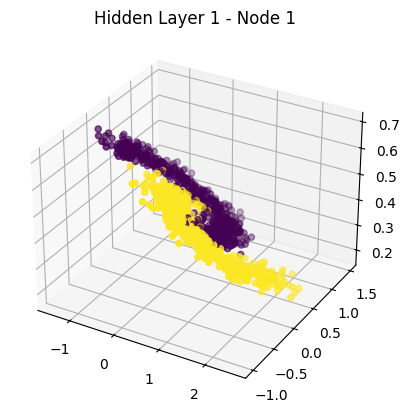

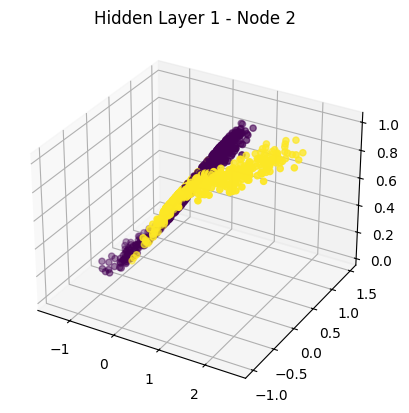

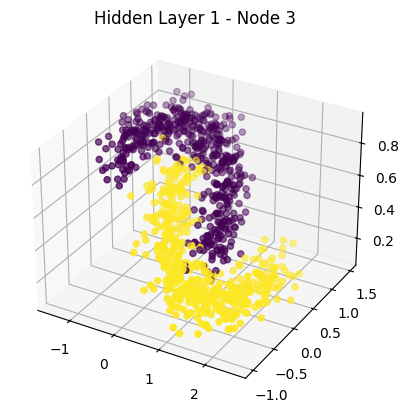

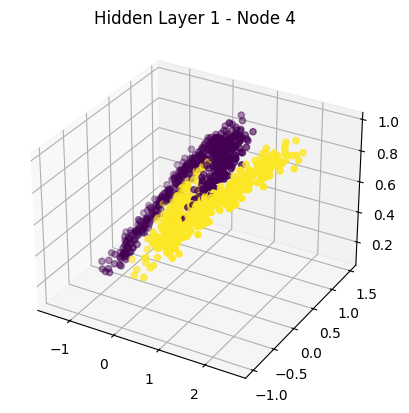

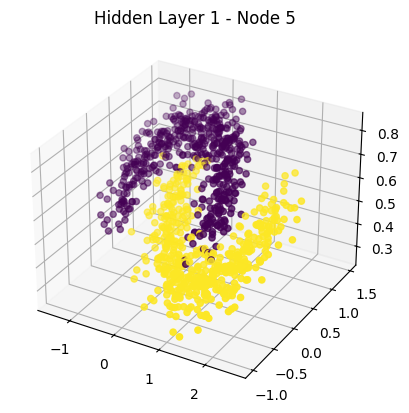

...

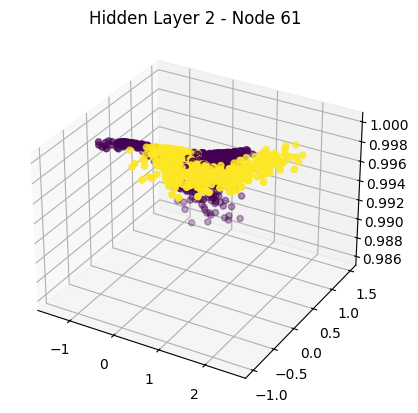

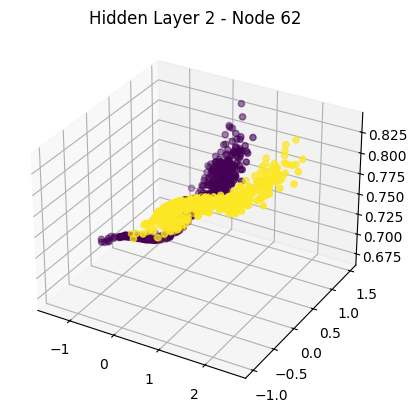

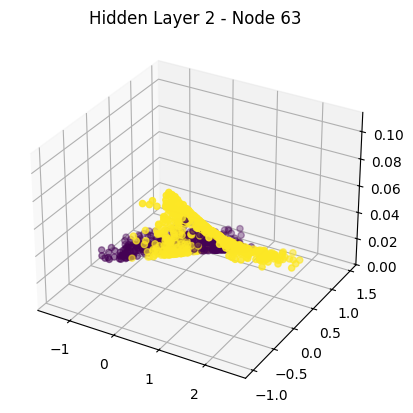

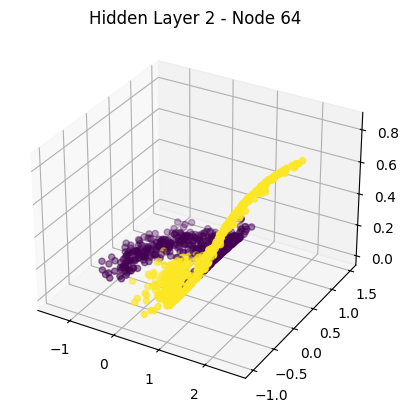

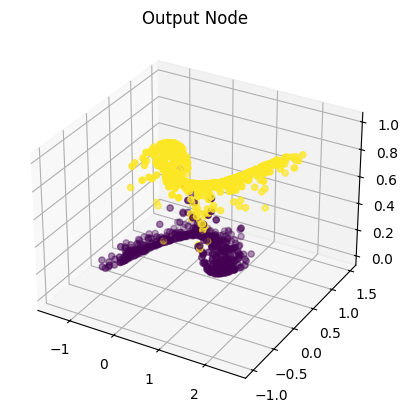

In [94]:
_ = model.forward(X)

for i in range(model.a1.shape[1]):
    plot_surface(model.a1[:,i], f"Hidden Layer 1 - Node {i+1}")

for i in range(model.a2.shape[1]):
    plot_surface(model.a2[:,i], f"Hidden Layer 2 - Node {i+1}")

plot_surface(model.out[:,0], "Output Node")
